In [1]:
import numpy as np
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils
from pix2pix import Pix2Pix
from cyclegan import CycleGAN

In [2]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [3]:
class FacadesDataset(torch.utils.data.Dataset):
    
    def __init__(self, folder='facades/train'):
        self.folder = folder
        self.files = glob(self.folder + '/*.jpg');
        self.transforms = transforms.Compose([
            transforms.ToTensor(),
        ])
        
    def __getitem__(self, idx):
        imgs = Image.open(self.files[idx]).convert("RGB")
        img_from, img_to = imgs.crop((256, 0, 512, 256)), imgs.crop((0, 0, 256, 256))
        return self.transforms(img_to), self.transforms(img_from)    
        
    def __len__(self):
        return len(self.files)

In [4]:
def training(model, number_of_experiments, dataloader, val_dataloader, alpha):
    for i in tqdm(range(number_of_experiments)):
        for batch in dataloader:
            gen_loss, disc_loss = model.train(batch, alpha)

        print(f"current epoch: {i}, current generator loss: {gen_loss}, current discriminator loss: {disc_loss}")
        
        if (i + 1) % 10 == 0:
            real, condition, fake = model.inference(next(iter(val_dataloader)))
            cond = np.transpose(condition.detach().cpu()[0], (1, 2, 0)) 
            fake = np.transpose(fake.detach().cpu()[0], (1, 2, 0)) 
            real = np.transpose(real.detach().cpu()[0], (1, 2, 0))
            fig, ax = plt.subplots(1, 3, figsize=(12, 8))
            ax[0].imshow(cond)
            ax[1].imshow(fake)
            ax[2].imshow(real)
            plt.show()   


In [5]:
def validate(model, loader):
    for i, batch in enumerate(loader):
        real, condition, fake = model.inference(batch)
        cond = np.transpose(condition.detach().cpu()[0], (1, 2, 0)) 
        fake = np.transpose(fake.detach().cpu()[0], (1, 2, 0)) 
        real = np.transpose(real.detach().cpu()[0], (1, 2, 0))
        fig, ax = plt.subplots(1, 3, figsize=(12, 8))
        ax[0].imshow(cond)
        ax[1].imshow(fake)
        ax[2].imshow(real)
        plt.show()   

# Часть первая: перенос стиля при помощи pix2pix


  2%|▏         | 1/50 [00:18<14:50, 18.18s/it]

current epoch: 0, current generator loss: 6.346900463104248, current discriminator loss: 0.2493179440498352


  4%|▍         | 2/50 [00:36<14:45, 18.45s/it]

current epoch: 1, current generator loss: 4.834603786468506, current discriminator loss: 0.22368058562278748


  6%|▌         | 3/50 [00:55<14:28, 18.47s/it]

current epoch: 2, current generator loss: 5.692195892333984, current discriminator loss: 0.19997355341911316


  8%|▊         | 4/50 [01:13<13:56, 18.18s/it]

current epoch: 3, current generator loss: 5.520276069641113, current discriminator loss: 0.17358168959617615


 10%|█         | 5/50 [01:30<13:23, 17.86s/it]

current epoch: 4, current generator loss: 4.936492919921875, current discriminator loss: 0.15917813777923584


 12%|█▏        | 6/50 [01:48<13:05, 17.86s/it]

current epoch: 5, current generator loss: 6.064042091369629, current discriminator loss: 0.11555801331996918


 14%|█▍        | 7/50 [02:05<12:43, 17.75s/it]

current epoch: 6, current generator loss: 5.6728386878967285, current discriminator loss: 0.13012073934078217


 16%|█▌        | 8/50 [02:23<12:20, 17.62s/it]

current epoch: 7, current generator loss: 5.332827568054199, current discriminator loss: 0.08195215463638306


 18%|█▊        | 9/50 [02:40<12:00, 17.56s/it]

current epoch: 8, current generator loss: 5.264126300811768, current discriminator loss: 0.08581363409757614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


current epoch: 9, current generator loss: 6.467193126678467, current discriminator loss: 0.05437600985169411


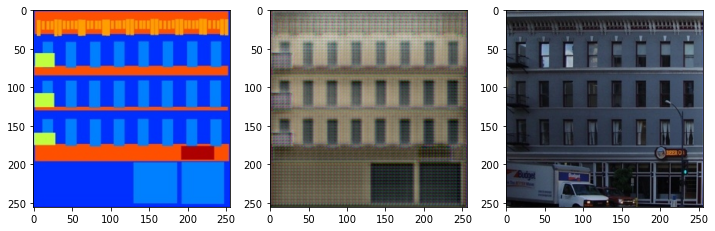

 22%|██▏       | 11/50 [03:15<11:27, 17.63s/it]

current epoch: 10, current generator loss: 5.458694934844971, current discriminator loss: 0.05432702600955963


 24%|██▍       | 12/50 [03:33<11:07, 17.58s/it]

current epoch: 11, current generator loss: 5.172704696655273, current discriminator loss: 0.1554783284664154


 26%|██▌       | 13/50 [03:50<10:49, 17.56s/it]

current epoch: 12, current generator loss: 4.950497150421143, current discriminator loss: 0.07548081874847412


 28%|██▊       | 14/50 [04:08<10:31, 17.53s/it]

current epoch: 13, current generator loss: 4.562676429748535, current discriminator loss: 0.07935412228107452


 30%|███       | 15/50 [04:25<10:13, 17.53s/it]

current epoch: 14, current generator loss: 5.718759536743164, current discriminator loss: 0.09219839423894882


 32%|███▏      | 16/50 [04:43<09:55, 17.51s/it]

current epoch: 15, current generator loss: 5.303774833679199, current discriminator loss: 0.08143765479326248


 34%|███▍      | 17/50 [05:00<09:38, 17.53s/it]

current epoch: 16, current generator loss: 6.084475040435791, current discriminator loss: 0.10344842821359634


 36%|███▌      | 18/50 [05:18<09:20, 17.51s/it]

current epoch: 17, current generator loss: 5.584978103637695, current discriminator loss: 0.11103120446205139


 38%|███▊      | 19/50 [05:35<09:03, 17.52s/it]

current epoch: 18, current generator loss: 5.561280250549316, current discriminator loss: 0.142896369099617


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


current epoch: 19, current generator loss: 5.6284074783325195, current discriminator loss: 0.07849633693695068


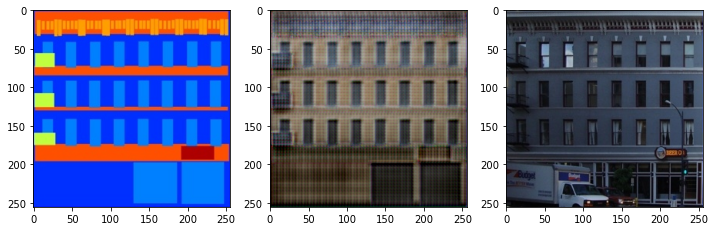

 42%|████▏     | 21/50 [06:11<08:29, 17.58s/it]

current epoch: 20, current generator loss: 4.877417087554932, current discriminator loss: 0.06602504849433899


 44%|████▍     | 22/50 [06:28<08:12, 17.57s/it]

current epoch: 21, current generator loss: 5.397804260253906, current discriminator loss: 0.11707814782857895


 46%|████▌     | 23/50 [06:46<07:53, 17.54s/it]

current epoch: 22, current generator loss: 4.347354888916016, current discriminator loss: 0.16706112027168274


 48%|████▊     | 24/50 [07:03<07:37, 17.58s/it]

current epoch: 23, current generator loss: 5.292909622192383, current discriminator loss: 0.1218937411904335


 50%|█████     | 25/50 [07:20<07:11, 17.26s/it]

current epoch: 24, current generator loss: 4.760991096496582, current discriminator loss: 0.10247883200645447


 52%|█████▏    | 26/50 [07:36<06:48, 17.03s/it]

current epoch: 25, current generator loss: 5.067748546600342, current discriminator loss: 0.07605448365211487


 54%|█████▍    | 27/50 [07:53<06:28, 16.88s/it]

current epoch: 26, current generator loss: 5.590172290802002, current discriminator loss: 0.06548610329627991


 56%|█████▌    | 28/50 [08:10<06:08, 16.77s/it]

current epoch: 27, current generator loss: 4.119975566864014, current discriminator loss: 0.15602357685565948


 58%|█████▊    | 29/50 [08:26<05:50, 16.69s/it]

current epoch: 28, current generator loss: 4.188113212585449, current discriminator loss: 0.0783013105392456


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


current epoch: 29, current generator loss: 4.560367584228516, current discriminator loss: 0.11854003369808197


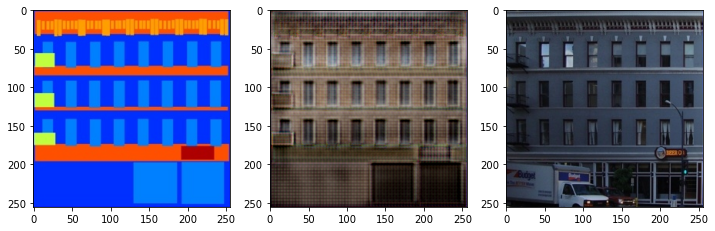

 62%|██████▏   | 31/50 [08:59<05:17, 16.69s/it]

current epoch: 30, current generator loss: 4.049116611480713, current discriminator loss: 0.0978153645992279


 64%|██████▍   | 32/50 [09:16<04:59, 16.64s/it]

current epoch: 31, current generator loss: 4.500573635101318, current discriminator loss: 0.10983149707317352


 66%|██████▌   | 33/50 [09:33<04:42, 16.60s/it]

current epoch: 32, current generator loss: 4.012569904327393, current discriminator loss: 0.10965043306350708


 68%|██████▊   | 34/50 [09:49<04:25, 16.57s/it]

current epoch: 33, current generator loss: 4.130581855773926, current discriminator loss: 0.10363735258579254


 70%|███████   | 35/50 [10:06<04:08, 16.56s/it]

current epoch: 34, current generator loss: 4.308193683624268, current discriminator loss: 0.13346372544765472


 72%|███████▏  | 36/50 [10:22<03:51, 16.54s/it]

current epoch: 35, current generator loss: 4.1299943923950195, current discriminator loss: 0.12726163864135742


 74%|███████▍  | 37/50 [10:39<03:34, 16.54s/it]

current epoch: 36, current generator loss: 4.360592842102051, current discriminator loss: 0.1005493551492691


 76%|███████▌  | 38/50 [10:55<03:18, 16.54s/it]

current epoch: 37, current generator loss: 3.7869608402252197, current discriminator loss: 0.1599883735179901


 78%|███████▊  | 39/50 [11:12<03:01, 16.54s/it]

current epoch: 38, current generator loss: 4.106340408325195, current discriminator loss: 0.11538727581501007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


current epoch: 39, current generator loss: 4.099967002868652, current discriminator loss: 0.09787875413894653


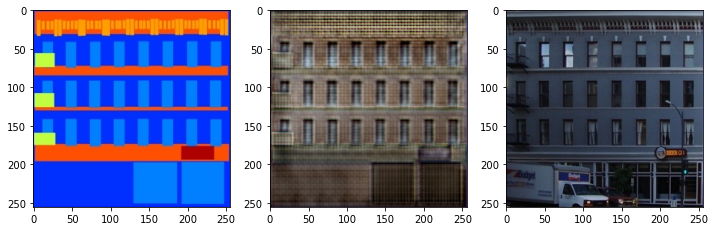

 82%|████████▏ | 41/50 [11:45<02:29, 16.59s/it]

current epoch: 40, current generator loss: 4.180553913116455, current discriminator loss: 0.10211171209812164


 84%|████████▍ | 42/50 [12:02<02:12, 16.57s/it]

current epoch: 41, current generator loss: 3.880765438079834, current discriminator loss: 0.09190504252910614


 86%|████████▌ | 43/50 [12:18<01:55, 16.55s/it]

current epoch: 42, current generator loss: 4.446754455566406, current discriminator loss: 0.09680472314357758


 88%|████████▊ | 44/50 [12:35<01:39, 16.54s/it]

current epoch: 43, current generator loss: 4.630577564239502, current discriminator loss: 0.09880752861499786


 90%|█████████ | 45/50 [12:51<01:22, 16.54s/it]

current epoch: 44, current generator loss: 3.7959790229797363, current discriminator loss: 0.10765938460826874


 92%|█████████▏| 46/50 [13:08<01:06, 16.54s/it]

current epoch: 45, current generator loss: 3.8824679851531982, current discriminator loss: 0.12377385050058365


 94%|█████████▍| 47/50 [13:24<00:49, 16.54s/it]

current epoch: 46, current generator loss: 3.6869118213653564, current discriminator loss: 0.11035601794719696


 96%|█████████▌| 48/50 [13:41<00:33, 16.53s/it]

current epoch: 47, current generator loss: 4.036816596984863, current discriminator loss: 0.09174957126379013


 98%|█████████▊| 49/50 [13:58<00:16, 16.67s/it]

current epoch: 48, current generator loss: 3.8600070476531982, current discriminator loss: 0.15515731275081635


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


current epoch: 49, current generator loss: 3.7699837684631348, current discriminator loss: 0.0851735845208168


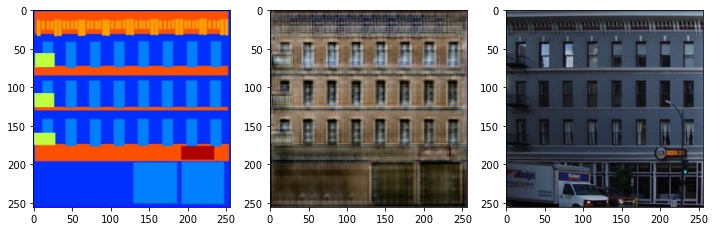

100%|██████████| 50/50 [14:16<00:00, 17.13s/it]


In [6]:
train = FacadesDataset('facades/train')
train_dataloader = DataLoader(train, batch_size=8, shuffle=True)
test = FacadesDataset('facades/test')
test_dataloader = DataLoader(test, batch_size=8, shuffle=False)

pix2pix = Pix2Pix(3, 3, device)
training(pix2pix, 50, train_dataloader, test_dataloader, 200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


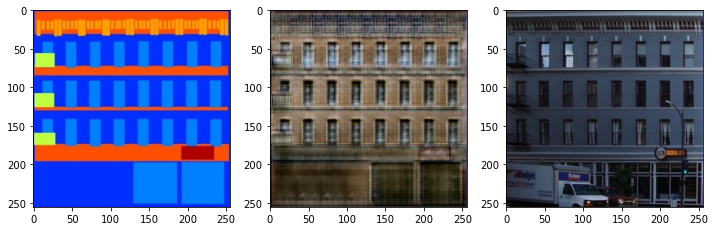

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


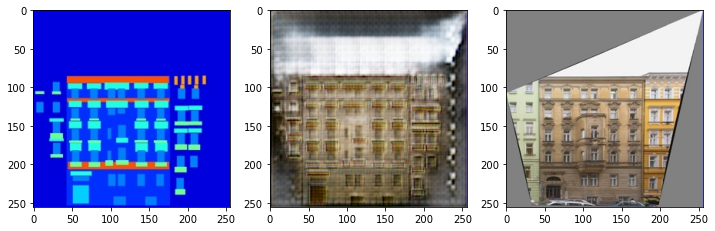

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


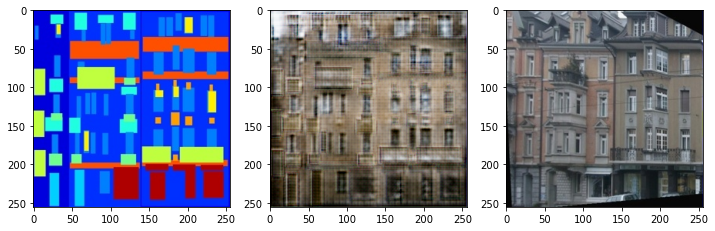

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


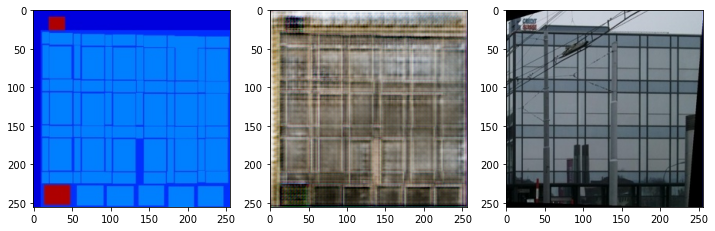

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


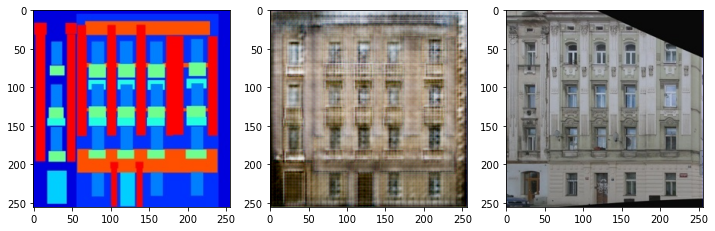

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


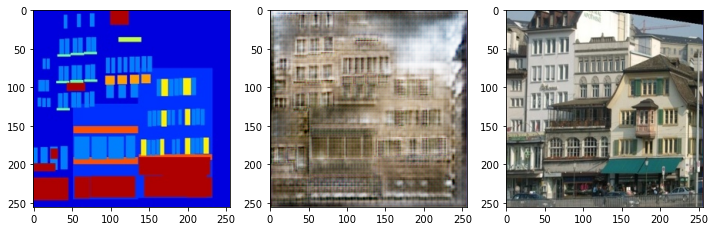

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


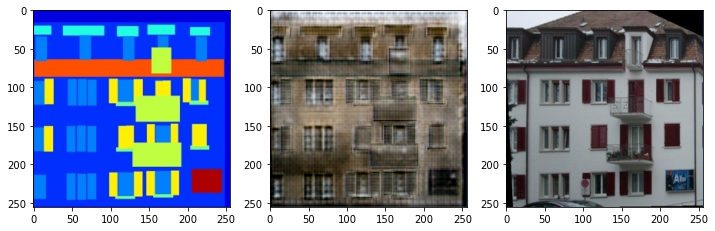

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


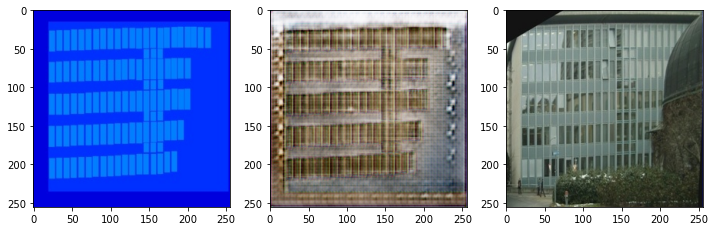

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


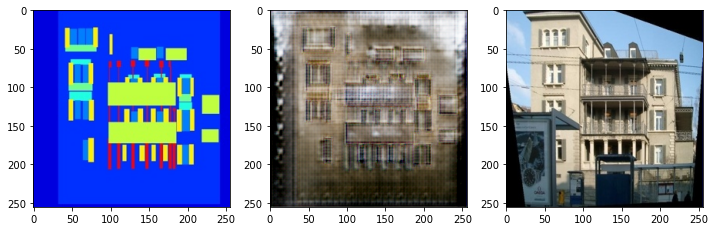

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


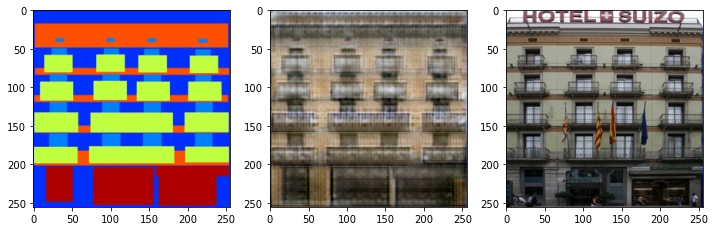

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


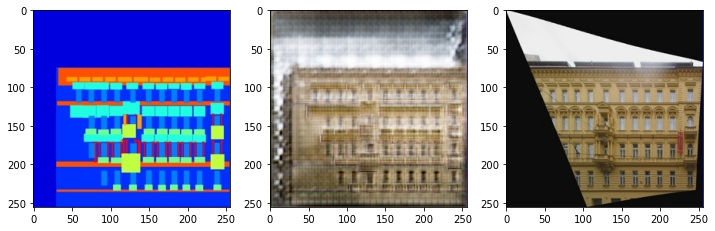

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


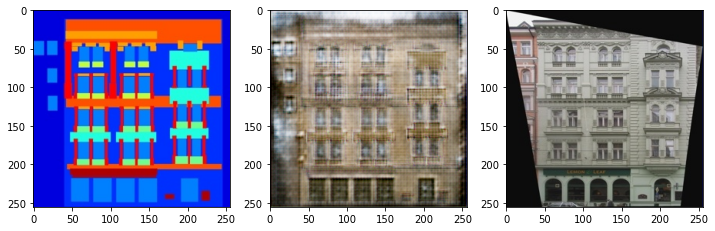

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


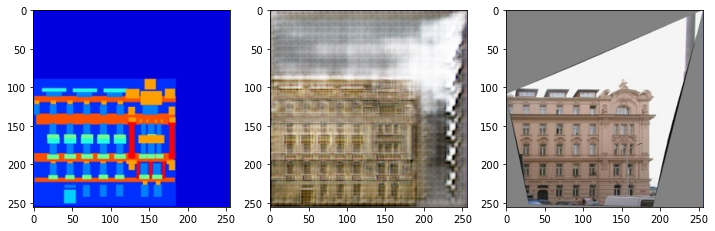

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


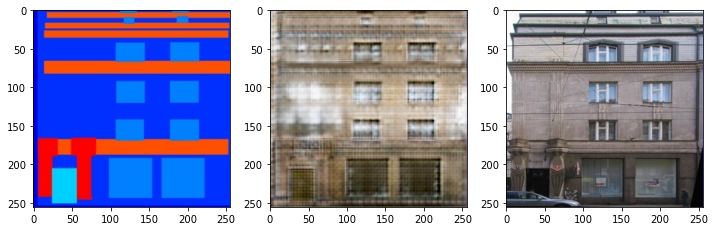

In [7]:
validate(pix2pix, test_dataloader)

# Часть вторая: добавим циклы


  2%|▏         | 1/50 [00:59<48:36, 59.52s/it]

current epoch: 0, current generator loss: 18.23617172241211, current discriminator loss: 0.24592871963977814


  4%|▍         | 2/50 [01:59<47:46, 59.72s/it]

current epoch: 1, current generator loss: 18.737049102783203, current discriminator loss: 0.1504942625761032


  6%|▌         | 3/50 [02:58<46:42, 59.63s/it]

current epoch: 2, current generator loss: 18.901323318481445, current discriminator loss: 0.0914001390337944


  8%|▊         | 4/50 [03:58<45:34, 59.44s/it]

current epoch: 3, current generator loss: 16.78366470336914, current discriminator loss: 0.028407316654920578


 10%|█         | 5/50 [04:57<44:37, 59.50s/it]

current epoch: 4, current generator loss: 18.76518440246582, current discriminator loss: 0.015019945800304413


 12%|█▏        | 6/50 [05:57<43:40, 59.56s/it]

current epoch: 5, current generator loss: 16.47953987121582, current discriminator loss: 0.014785158447921276


 14%|█▍        | 7/50 [06:56<42:41, 59.58s/it]

current epoch: 6, current generator loss: 15.516246795654297, current discriminator loss: 0.013483760878443718


 16%|█▌        | 8/50 [07:56<41:41, 59.56s/it]

current epoch: 7, current generator loss: 15.134242057800293, current discriminator loss: 0.015626488253474236


 18%|█▊        | 9/50 [08:56<40:42, 59.58s/it]

current epoch: 8, current generator loss: 18.94489288330078, current discriminator loss: 0.01315084844827652
current epoch: 9, current generator loss: 14.486733436584473, current discriminator loss: 0.01233443059027195


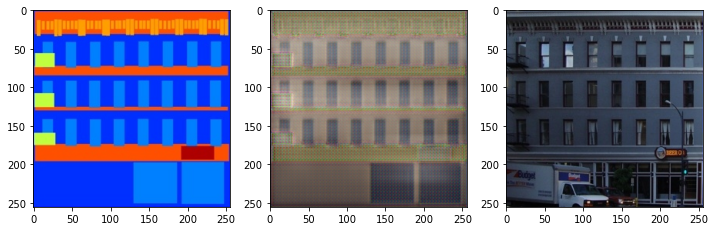

 22%|██▏       | 11/50 [10:51<37:58, 58.42s/it]

current epoch: 10, current generator loss: 13.715715408325195, current discriminator loss: 0.009044086560606956


 24%|██▍       | 12/50 [11:45<36:01, 56.88s/it]

current epoch: 11, current generator loss: 15.836669921875, current discriminator loss: 0.007116040214896202


 26%|██▌       | 13/50 [12:38<34:25, 55.82s/it]

current epoch: 12, current generator loss: 15.147542953491211, current discriminator loss: 0.007619255222380161


 28%|██▊       | 14/50 [13:31<33:02, 55.08s/it]

current epoch: 13, current generator loss: 17.560123443603516, current discriminator loss: 0.007535923272371292


 30%|███       | 15/50 [14:25<31:50, 54.57s/it]

current epoch: 14, current generator loss: 14.202312469482422, current discriminator loss: 0.009761950001120567


 32%|███▏      | 16/50 [15:19<30:56, 54.61s/it]

current epoch: 15, current generator loss: 13.556327819824219, current discriminator loss: 0.004333213437348604


 34%|███▍      | 17/50 [16:18<30:39, 55.75s/it]

current epoch: 16, current generator loss: 14.027839660644531, current discriminator loss: 0.005747633054852486


 36%|███▌      | 18/50 [17:15<29:57, 56.16s/it]

current epoch: 17, current generator loss: 12.166994094848633, current discriminator loss: 0.007233644835650921


 38%|███▊      | 19/50 [18:15<29:35, 57.28s/it]

current epoch: 18, current generator loss: 13.811296463012695, current discriminator loss: 0.0026604491285979748
current epoch: 19, current generator loss: 11.12559986114502, current discriminator loss: 0.006512915715575218


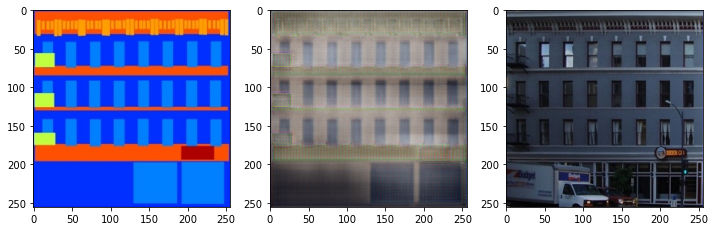

 42%|████▏     | 21/50 [20:15<28:19, 58.62s/it]

current epoch: 20, current generator loss: 12.521053314208984, current discriminator loss: 0.005918354727327824


 44%|████▍     | 22/50 [21:14<27:28, 58.88s/it]

current epoch: 21, current generator loss: 12.533135414123535, current discriminator loss: 0.005398639943450689


 46%|████▌     | 23/50 [22:14<26:35, 59.09s/it]

current epoch: 22, current generator loss: 11.70374584197998, current discriminator loss: 0.002745291916653514


 48%|████▊     | 24/50 [23:13<25:40, 59.24s/it]

current epoch: 23, current generator loss: 9.58902359008789, current discriminator loss: 0.0020005004480481148


 50%|█████     | 25/50 [24:13<24:42, 59.31s/it]

current epoch: 24, current generator loss: 11.002460479736328, current discriminator loss: 0.005927191581577063


 52%|█████▏    | 26/50 [25:09<23:21, 58.41s/it]

current epoch: 25, current generator loss: 12.140339851379395, current discriminator loss: 0.003723960369825363


 54%|█████▍    | 27/50 [26:02<21:48, 56.89s/it]

current epoch: 26, current generator loss: 10.551721572875977, current discriminator loss: 0.0034186579287052155


 56%|█████▌    | 28/50 [26:56<20:28, 55.83s/it]

current epoch: 27, current generator loss: 11.467116355895996, current discriminator loss: 0.0023614540696144104


 58%|█████▊    | 29/50 [27:49<19:17, 55.10s/it]

current epoch: 28, current generator loss: 9.509737968444824, current discriminator loss: 0.003157694125548005
current epoch: 29, current generator loss: 10.524715423583984, current discriminator loss: 0.009206695482134819


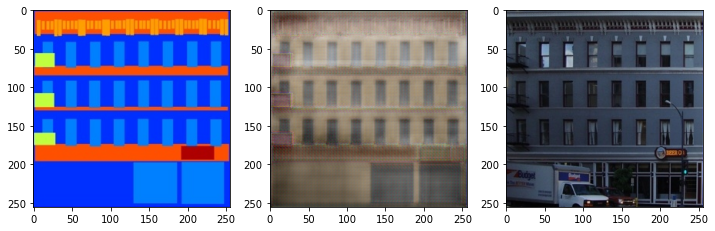

 62%|██████▏   | 31/50 [29:36<17:11, 54.30s/it]

current epoch: 30, current generator loss: 8.656097412109375, current discriminator loss: 0.003158594947308302


 64%|██████▍   | 32/50 [30:30<16:12, 54.04s/it]

current epoch: 31, current generator loss: 9.740742683410645, current discriminator loss: 0.003739977488294244


 66%|██████▌   | 33/50 [31:23<15:15, 53.87s/it]

current epoch: 32, current generator loss: 9.498918533325195, current discriminator loss: 0.003064954187721014


 68%|██████▊   | 34/50 [32:17<14:20, 53.77s/it]

current epoch: 33, current generator loss: 10.658706665039062, current discriminator loss: 0.006164577789604664


 70%|███████   | 35/50 [33:10<13:25, 53.68s/it]

current epoch: 34, current generator loss: 8.839519500732422, current discriminator loss: 0.00499515887349844


 72%|███████▏  | 36/50 [34:04<12:30, 53.59s/it]

current epoch: 35, current generator loss: 10.213700294494629, current discriminator loss: 0.002661970676854253


 74%|███████▍  | 37/50 [34:57<11:36, 53.54s/it]

current epoch: 36, current generator loss: 8.918519020080566, current discriminator loss: 0.0035912315361201763


 76%|███████▌  | 38/50 [35:50<10:42, 53.52s/it]

current epoch: 37, current generator loss: 8.663305282592773, current discriminator loss: 0.003569753374904394


 78%|███████▊  | 39/50 [36:44<09:48, 53.50s/it]

current epoch: 38, current generator loss: 8.022045135498047, current discriminator loss: 0.002308555645868182
current epoch: 39, current generator loss: 8.364627838134766, current discriminator loss: 0.0017813208978623152


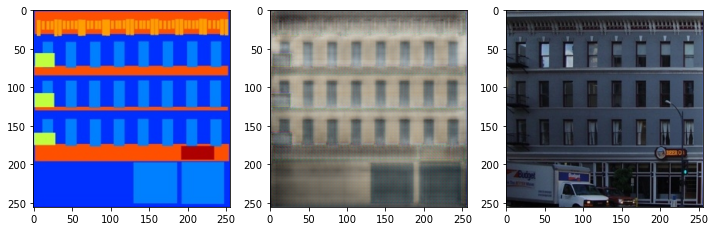

 82%|████████▏ | 41/50 [38:31<08:01, 53.53s/it]

current epoch: 40, current generator loss: 7.280618667602539, current discriminator loss: 0.0015810644254088402


 84%|████████▍ | 42/50 [39:25<07:07, 53.49s/it]

current epoch: 41, current generator loss: 7.4289984703063965, current discriminator loss: 0.0024323989637196064


 86%|████████▌ | 43/50 [40:18<06:14, 53.49s/it]

current epoch: 42, current generator loss: 8.918277740478516, current discriminator loss: 0.0019592409953475


 88%|████████▊ | 44/50 [41:11<05:20, 53.48s/it]

current epoch: 43, current generator loss: 8.683351516723633, current discriminator loss: 0.00749059347435832


 90%|█████████ | 45/50 [42:05<04:27, 53.45s/it]

current epoch: 44, current generator loss: 7.988076686859131, current discriminator loss: 0.002026379108428955


 92%|█████████▏| 46/50 [42:58<03:33, 53.45s/it]

current epoch: 45, current generator loss: 8.010419845581055, current discriminator loss: 0.0020833874586969614


 94%|█████████▍| 47/50 [43:52<02:40, 53.43s/it]

current epoch: 46, current generator loss: 7.131546974182129, current discriminator loss: 0.0017269430682063103


 96%|█████████▌| 48/50 [44:45<01:46, 53.40s/it]

current epoch: 47, current generator loss: 6.435824871063232, current discriminator loss: 0.0015604007057845592


 98%|█████████▊| 49/50 [45:38<00:53, 53.41s/it]

current epoch: 48, current generator loss: 7.154647350311279, current discriminator loss: 0.0017584203742444515
current epoch: 49, current generator loss: 8.271137237548828, current discriminator loss: 0.001945690019056201


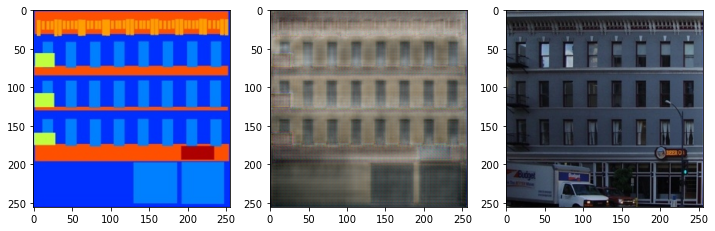

100%|██████████| 50/50 [46:32<00:00, 55.85s/it]


In [8]:
train = FacadesDataset('facades/train')
train_dataloader = DataLoader(train, batch_size=4, shuffle=True)
test = FacadesDataset('facades/test')
test_dataloader = DataLoader(test, batch_size=4, shuffle=False)

cyclegan = CycleGAN(3, 3, device)
training(cyclegan, 50, train_dataloader, test_dataloader, 200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


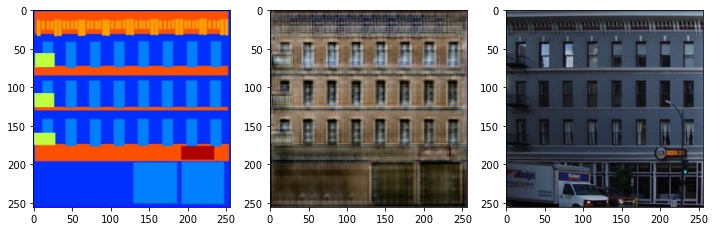

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


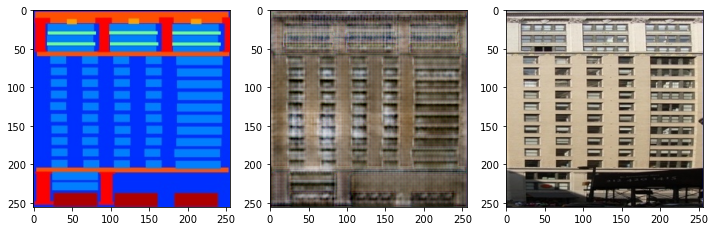

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


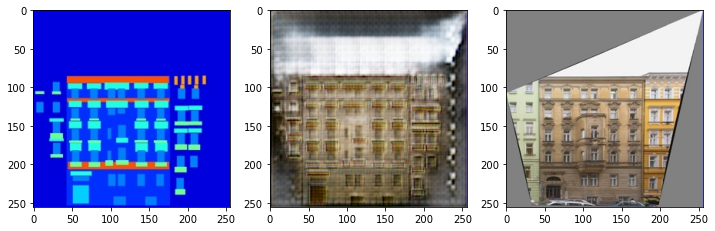

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


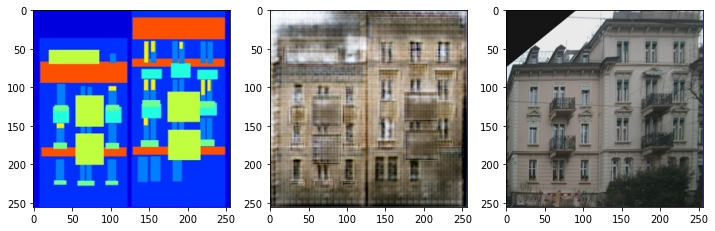

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


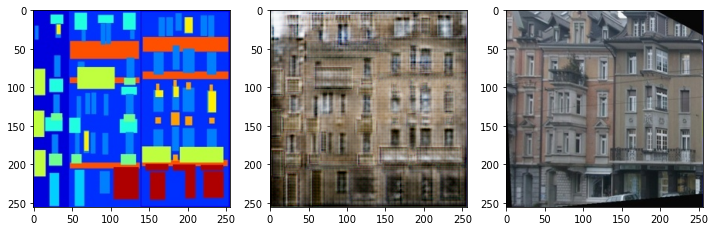

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


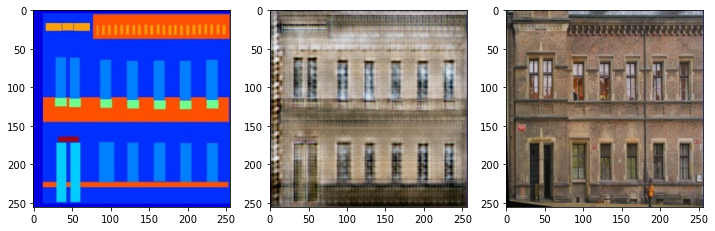

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


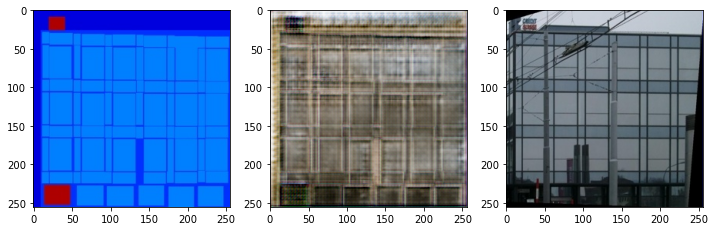

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


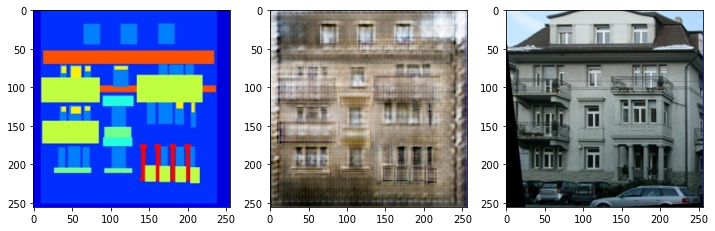

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


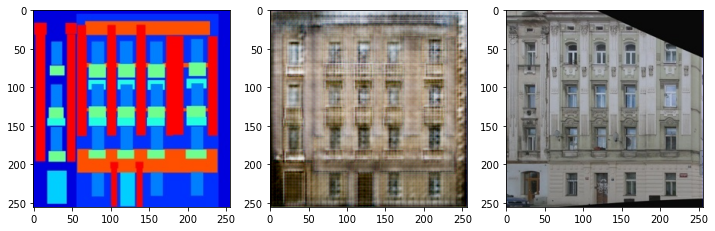

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


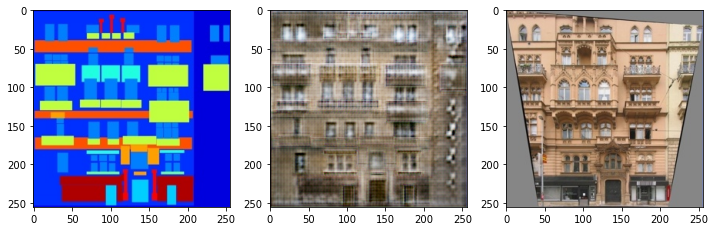

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


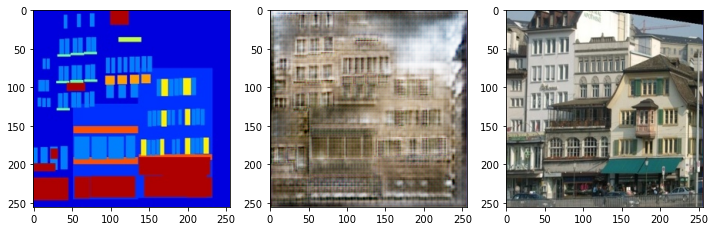

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


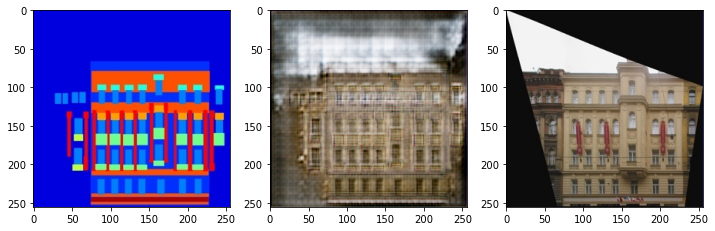

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


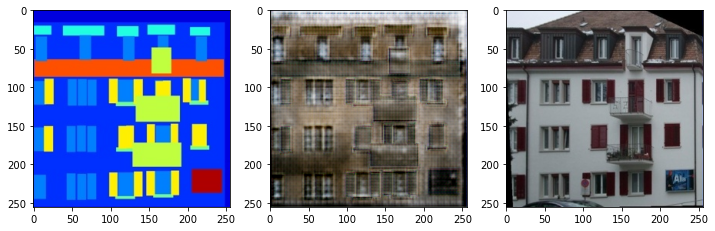

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


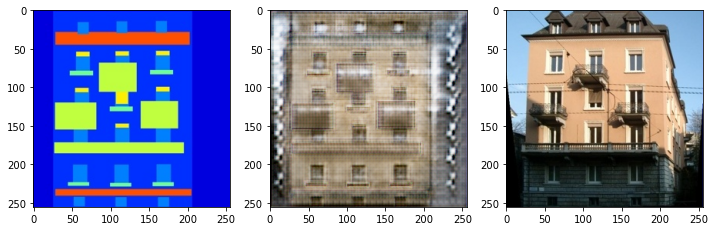

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


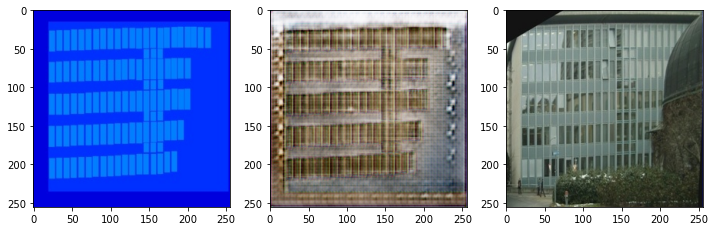

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


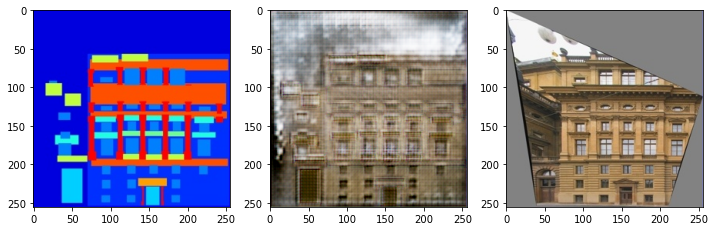

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


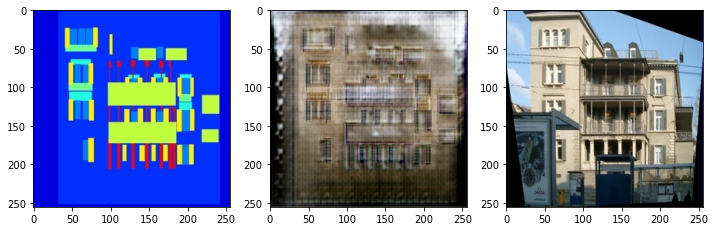

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


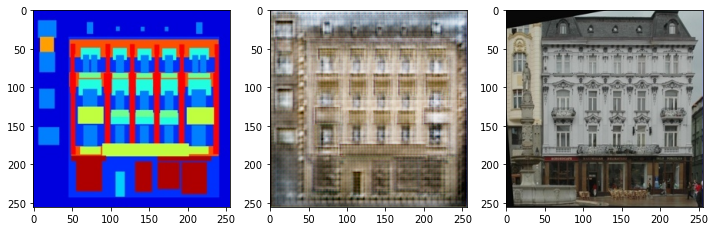

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


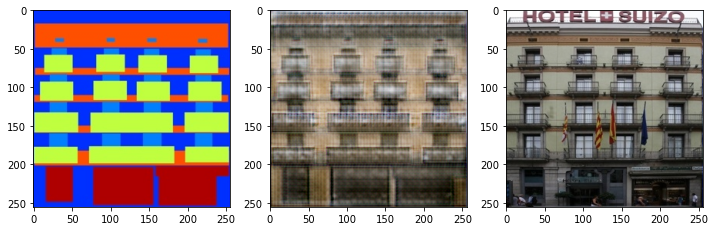

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


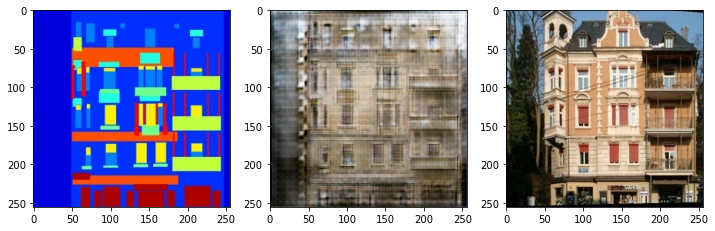

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


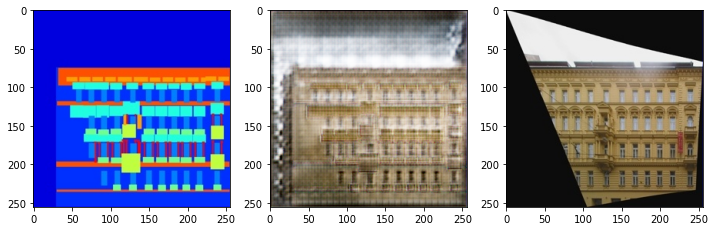

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


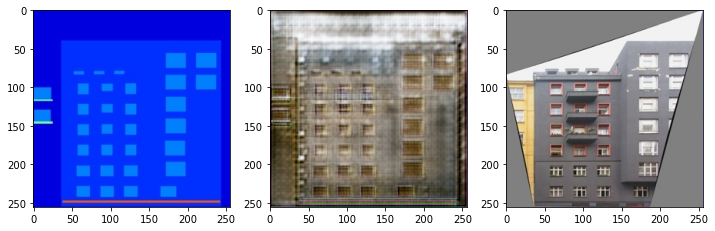

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


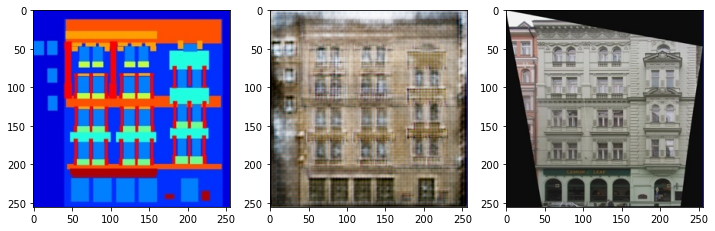

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


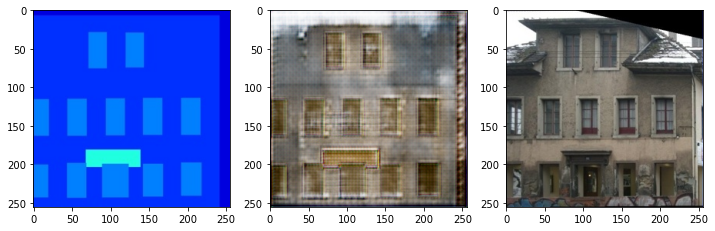

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


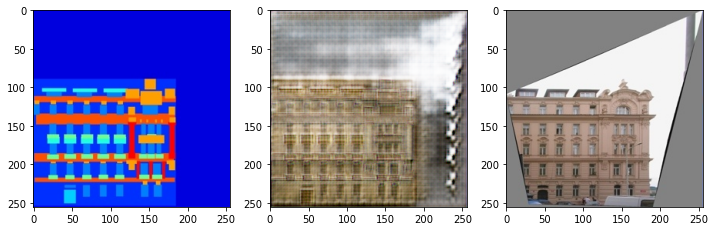

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


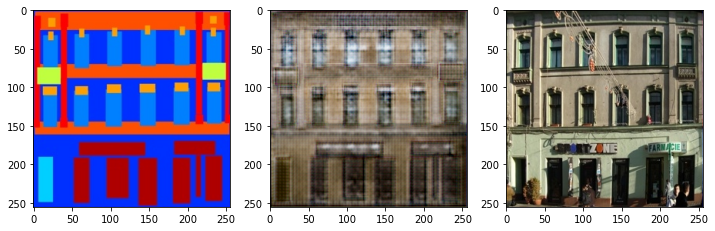

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


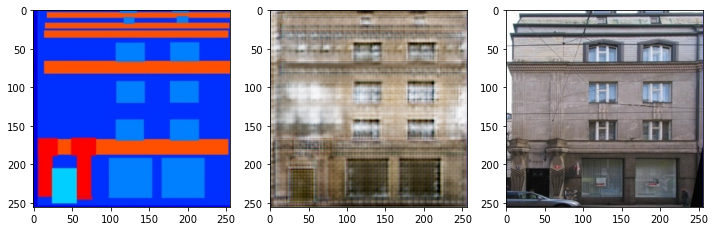

In [9]:
validate(pix2pix, test_dataloader)